# Pavia & its Delicacies

Hello, I'm Davide and this is the last notebook project for the Coursera Course "IBM Data Science Professional Certificate".

For this project I decide to explore the city where I was born and live : Pavia.
We'll going to explore its territory and cooking.

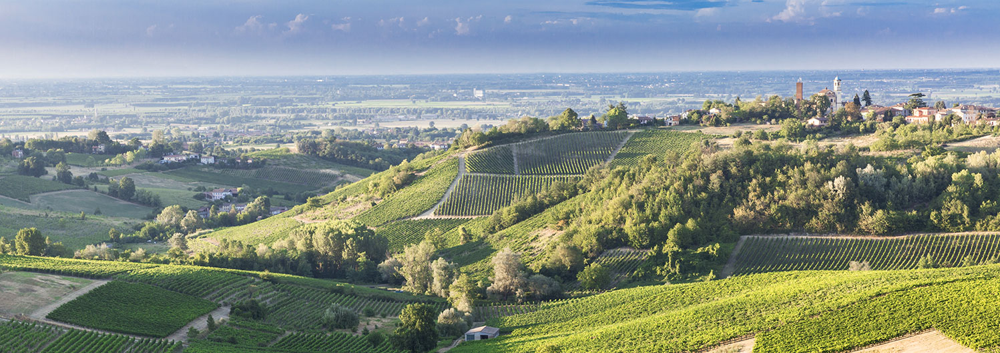

## 1. Introduction

With this notebook we'll explore the principal cities of Pavia province and the different restuarants and food store to find where a restaurateur should open its restaurant based on his type of cousine.

I hope we'll find many different exemples: from the tasty and healthy cuisine of the farmhouse in Oltrepò to the fast and frenetic food of the cities

We'll compare the different types across the region and try to find insight and cluster the data to create a report for every restaurateaur or merchant that wanna open a bussiness in this area
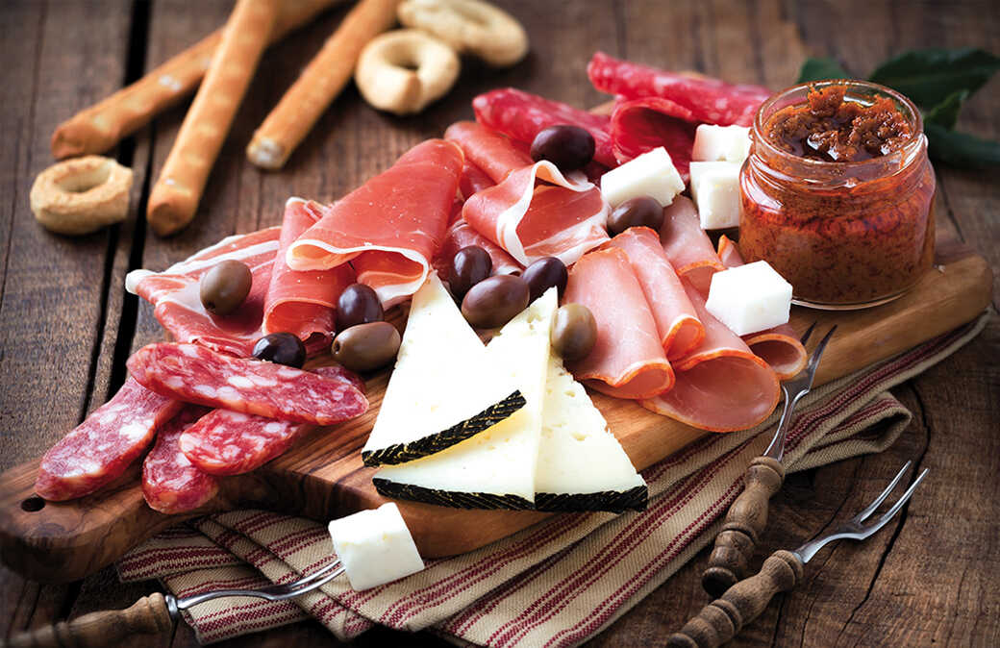

Because this area is also full of historic and art place we get also data for this places and try to find if is a relation between "nice" places and "delicius" places

<b>Let's Run to the Hills and let's fill our belly!</b>

In [1]:
import numpy as np
import pandas as pd
from bs4 import BeautifulSoup
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import folium
#!pip install geopy
from geopy.geocoders import Nominatim
import json
from math import sin, cos, sqrt, atan2, radians


## 2. Data

First we create a dataset contain the 10 municipalities of Pavia Province

In [2]:
url = "https://en.wikipedia.org/wiki/Province_of_Pavia"
page_html = requests.get(url)
page_html

<Response [200]>

In [3]:
page_obj = BeautifulSoup(page_html.content,"html5lib")

In [4]:
tables = page_obj.find_all("table")
table = tables[1]
table# this his our table

<table class="wikitable" style="text-align:center">

<tbody><tr>
<th>Rank
</th>
<th>City
</th>
<th>Population
</th>
<th>Area<br/> (km<sup>2</sup>)
</th>
<th>Density<br/> (inhabitants/km<sup>2</sup>)
</th>
<th>Altitude<br/>  (mslm)
</th></tr>
<tr>
<td>1st
</td>
<td><a href="/wiki/Pavia" title="Pavia">Pavia</a>
</td>
<td>71,142
</td>
<td>62
</td>
<td>1147.5
</td>
<td>77
</td></tr>
<tr>
<td>2nd
</td>
<td><a href="/wiki/Vigevano" title="Vigevano">Vigevano</a>
</td>
<td>63,984
</td>
<td>82
</td>
<td>780.3
</td>
<td>116
</td></tr>
<tr>
<td>3rd
</td>
<td><a href="/wiki/Voghera" title="Voghera">Voghera</a>
</td>
<td>39,937
</td>
<td>63.28
</td>
<td>631.1
</td>
<td>96
</td></tr>
<tr>
<td>4th
</td>
<td><a href="/wiki/Mortara,_Lombardy" title="Mortara, Lombardy">Mortara</a>
</td>
<td>15,673
</td>
<td>52
</td>
<td>301.4
</td>
<td>108
</td></tr>
<tr>
<td>5th
</td>
<td><a href="/wiki/Stradella,_Lombardy" title="Stradella, Lombardy">Stradella</a>
</td>
<td>11,674
</td>
<td>18.77
</td>
<td>621.9
</td>

In [5]:
content = []
columns =[]
for i, r in enumerate(table.findAll("tr")):
    if i == 0:
        for c in table.find("tr").findAll('th'):
            title = c.text.replace('\n','')
            if '(' in title:
                title= title.split('(')[0].replace(' ','')
            columns.append(title)
    else:
        row={}
        for j, c in enumerate(r.findAll("td")):
            if j==0:
                row['Rank'] = c.text.replace('\n','')
            if j==1:
                row['City'] = c.text.replace('\n','')
            if j==2:
                row['Population'] = float(c.text.replace('\n','').replace(',','.'))
            if j==3:
                row['Area'] = float(c.text.replace('\n','').replace(',','.'))
            if j==4:
                row['Density'] = float(c.text.replace('\n','').replace(',','.'))
            if j==5:
                row['Altitude'] = float(c.text.replace('\n','').replace(',','.'))
        content.append(row)
                
municipalities = pd.DataFrame(content,columns=columns)
municipalities

,Rank,City,Population,Area,Density,Altitude
0,1st,Pavia,71.142,62.00,1147.5,77.0
1,2nd,Vigevano,63.984,82.00,780.3,116.0
2,3rd,Voghera,39.937,63.28,631.1,96.0
3,4th,Mortara,15.673,52.00,301.4,108.0
4,5th,Stradella,11.674,18.77,621.9,101.0
5,6th,Gambolò,10.312,51.00,202.2,104.0
6,7th,Garlasco,9.888,39.03,253.3,93.0
7,8th,Broni,9.528,20.87,456.5,88.0
8,9th,Casorate Primo,8.425,9.00,936.1,103.0
9,10th,Cassolnovo,7.116,31.96,222.7,120.0


We also add Belgioiso, Mede, Vidigulfo, Robbio and Varzi for a best coverage of the correct area

In [6]:
b = {'Rank':'---','City':'Belgioioso','Population':5.752,'Area':24.00,'Density':240.0,'Altitude':75}
m = {'Rank':'---','City':'Mede','Population':6.993,'Area':33.20,'Density':210.0,'Altitude':93}
g = {'Rank':'---','City':'Vidigulfo','Population':6.264,'Area':16.14,'Density':329.0,'Altitude': 88}
r = {'Rank':'---','City':'Robbio','Population':6.161,'Area':40.3,'Density':150.0,'Altitude':122}
v = {'Rank':'---','City':'Varzi','Population':3.383,'Area':57.61,'Density':59.0,'Altitude':426}

municipalities = municipalities.append(b,ignore_index=True)
municipalities = municipalities.append(m,ignore_index=True)
municipalities = municipalities.append(g,ignore_index=True)
municipalities = municipalities.append(r,ignore_index=True)
municipalities = municipalities.append(v,ignore_index=True)

Ok! This is out municipalities dataset where:
 - Area measure in Km2
 - Density measure in inhabitants/Km2
 - Altitude measure in mslm
 
Let's add Latitude and Longitude of the principal city

In [7]:
coords =[]
for city in municipalities['City']:
    coord={}
    geolocator = Nominatim(user_agent="Pavia")
    location = geolocator.geocode('{}, PV'.format(city))
    coord['Latitude'] = location.latitude
    coord['Longitude'] = location.longitude
    coord['City'] = city
    coords.append(coord)

coords = pd.DataFrame(coords)

municipalities = pd.merge(municipalities,coords, on ='City')
municipalities


,Rank,City,Population,Area,Density,Altitude,Latitude,Longitude
0,1st,Pavia,71.142,62.00,1147.5,77.0,45.186004,9.154637
1,2nd,Vigevano,63.984,82.00,780.3,116.0,45.317094,8.858603
2,3rd,Voghera,39.937,63.28,631.1,96.0,44.992840,9.008593
3,4th,Mortara,15.673,52.00,301.4,108.0,45.247922,8.736385
4,5th,Stradella,11.674,18.77,621.9,101.0,45.077356,9.295017
5,6th,Gambolò,10.312,51.00,202.2,104.0,45.259030,8.859060
6,7th,Garlasco,9.888,39.03,253.3,93.0,45.197362,8.923746
7,8th,Broni,9.528,20.87,456.5,88.0,45.062162,9.261191
8,9th,Casorate Primo,8.425,9.00,936.1,103.0,45.312366,9.016846
9,10th,Cassolnovo,7.116,31.96,222.7,120.0,45.365560,8.810088


Let's plot this beatiful region! (define a functions for plotting in the zone)

In [8]:
def plotting_point(empty_map,latitudes,longitudes,names,p_color,p_rad):
    for lat,lon,lab in zip(latitudes,longitudes,names):
        label = lab
        folium.CircleMarker(
        [lat,lon],
        radius=p_rad,
        popup=label,
        color = p_color,
        fill = True,
        fill_opacoty=0.6,
        parse_html=False).add_to(empty_map)


In [9]:
latitude_c = 45.09480500513577
longitude_c = 9.031849235246689 # Mezzana Rabattone the center of the province (more or less)

pavia_map = folium.Map(location =[latitude_c,longitude_c],zoom_start=8.5,tiles='Stamen Terrain')
plotting_point(pavia_map,municipalities['Latitude'],municipalities['Longitude'],municipalities['City'],'red',40)
    
pavia_map

Now that we define the geography are we'll get data about restaurant from Fromsquare API

In [10]:
CLIENT_ID = 'KEAE0PZEAU05ECG52IV3OVDF1PHT0TIPKMFW3XBS2WODWMJO' 
CLIENT_SECRET = 'MSCZOARQL1VCZPQBSXOA3WL5AAK4QRJTHEIDV51SWO3N23ST' 
VERSION = '20210801' 
LIMIT = 100 

Let's see which venue macro-categories Foursquare offers

In [11]:
url ='https://api.foursquare.com/v2/venues/categories?&client_id={}&client_secret={}&v={}'.format(CLIENT_ID,CLIENT_SECRET,VERSION)
results = requests.get(url).json()['response']['categories']
results
categories = []
categories.append([(c['id'],c['name']) for c in results])
categories

[[('4d4b7104d754a06370d81259', 'Arts & Entertainment'),
  ('4d4b7105d754a06372d81259', 'College & University'),
  ('4d4b7105d754a06373d81259', 'Event'),
  ('4d4b7105d754a06374d81259', 'Food'),
  ('4d4b7105d754a06376d81259', 'Nightlife Spot'),
  ('4d4b7105d754a06377d81259', 'Outdoors & Recreation'),
  ('4d4b7105d754a06375d81259', 'Professional & Other Places'),
  ('4e67e38e036454776db1fb3a', 'Residence'),
  ('4d4b7105d754a06378d81259', 'Shop & Service'),
  ('4d4b7105d754a06379d81259', 'Travel & Transport')]]

We'll get only venue where the categories is "Food" & "Nightlife Spot"

In [12]:
CAT_IDS =['4d4b7105d754a06374d81259','4d4b7105d754a06376d81259']
RADIUS = 10000 #10 KM around the city
LIMIT = 300 

Def a function to get all restaurants near a city

In [13]:
def get_nearby_venue_by_cat(names,latitudes,longitudes,cat_ids,radius):
    venues=[]
    for cat_id in cat_ids:
        for name, lat, lon in zip(names,latitudes,longitudes):
            url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
            CLIENT_ID,
            CLIENT_SECRET,
            VERSION,
            lat,
            lon,
            radius,
            LIMIT,
            cat_id)

            results = requests.get(url).json()["response"]['venues']
            venues.append([(
                name,
                lat,
                lon,
                v['id'],
                v['name'],
                v['location']['lat'],
                v['location']['lng'],
                v['categories'][0]['id'],
                v['categories'][0]['name'],
                v['location']['distance'])for v in results])
        
    nearby_venues = pd.DataFrame([item for venues in venues for item in venues])
    nearby_venues.columns = ['City','City Lat','City Lon', 'Venue Id','Venue Name','Venue Lat','Venue Lon','Venue CategoryId','Venue Category Name','Distance City']
    
    return nearby_venues
        
        

In [14]:
food_venues = get_nearby_venue_by_cat (names=municipalities['City'],
                                      latitudes=municipalities['Latitude'],
                                     longitudes=municipalities['Longitude'],
                                     cat_ids=CAT_IDS,
                                     radius=RADIUS)



In [15]:
food_venues

,City,City Lat,City Lon,Venue Id,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City
0,Pavia,45.186004,9.154637,593406ac4c954c63dbd6619a,Victoria,45.185555,9.154521,4bf58dd8d48988d143941735,Breakfast Spot,50
1,Pavia,45.186004,9.154637,5f10afd25bf27f3ad4af0c14,Latte Mascheroni,45.185463,9.156145,4bf58dd8d48988d1c9941735,Ice Cream Shop,132
2,Pavia,45.186004,9.154637,4c434d46ce54e21e50e40d1a,Pizzeria Regisole,45.185037,9.152737,4bf58dd8d48988d1ca941735,Pizza Place,183
3,Pavia,45.186004,9.154637,58a9c31e102f472e5f2b317c,Brau Stube,45.185192,9.154227,4bf58dd8d48988d10d941735,German Restaurant,95
4,Pavia,45.186004,9.154637,60ff11190e19e35ed7dc6bb8,Angelo Del Gelato,45.186222,9.155709,5f2c407c5b4c177b9a6dc536,Gelato Shop,87
...,...,...,...,...,...,...,...,...,...,...
1277,Varzi,44.823540,9.196904,514501bee4b021dad31743b9,Debar,44.851762,9.097498,4bf58dd8d48988d116941735,Bar,8452
1278,Varzi,44.823540,9.196904,4ea07df84fc673906ca0342b,Birrificio Ponte Blu,44.796622,9.278255,50327c8591d4c4b30a586d5d,Brewery,7089
1279,Varzi,44.823540,9.196904,4e22f6c51838712abe820576,Bar Casa Ponte,44.877942,9.165032,4bf58dd8d48988d116941735,Bar,6557
1280,Varzi,44.823540,9.196904,5001bd93e4b05ceffc48f96a,Centro Ricreativo Livelli,44.832952,9.150467,4bf58dd8d48988d116941735,Bar,3812


Because it is a "limited" zone maybe we can get the same restaurant for different cities

In [16]:
food_venues['Venue Id'].value_counts()

4bee7ed6e24d20a1f5f77214    8
5c5b30e4e96d0c002c14b728    6
4bf7e8de4a67c928d65324cf    6
4bd4361a462cb71329d9df07    6
5da20ccf03db2f0007b3ef7c    5
                           ..
4e75d593ae60c328514ba71d    1
4c8bda3355fba09354015aab    1
4da032f5e8a6721e6a1932a5    1
518114c3498e812ad68da896    1
4e773e72ae60c32851e73ded    1
Name: Venue Id, Length: 840, dtype: int64

So let's drop the duplicate Venue taking only the record with the less distance

In [17]:
food_venues[food_venues['Venue Id'] =="57d59a5bcd1004bb53c56474"] 

,City,City Lat,City Lon,Venue Id,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City
78,Vigevano,45.317094,8.858603,57d59a5bcd1004bb53c56474,Burger Shop,45.31977,8.86128,4bf58dd8d48988d1c4941735,Restaurant,364
246,Gambolò,45.259030,8.859060,57d59a5bcd1004bb53c56474,Burger Shop,45.31977,8.86128,4bf58dd8d48988d1c4941735,Restaurant,6763
440,Cassolnovo,45.365560,8.810088,57d59a5bcd1004bb53c56474,Burger Shop,45.31977,8.86128,4bf58dd8d48988d1c4941735,Restaurant,6482


In [18]:
def remove_duplicates(df):
    df.sort_values(by=['Venue Id','Distance City'], ascending = True, inplace=True) # ording dataset for Venue Id and Distance
    df.drop_duplicates(subset='Venue Id', keep="first", inplace= True) # drop duplicates  Venue Id and keep the first
    return df

food_venues = remove_duplicates(food_venues)
food_venues[food_venues['Venue Id'] =="57d59a5bcd1004bb53c56474"] 

,City,City Lat,City Lon,Venue Id,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City
78,Vigevano,45.317094,8.858603,57d59a5bcd1004bb53c56474,Burger Shop,45.31977,8.86128,4bf58dd8d48988d1c4941735,Restaurant,364


In [19]:
food_venues.shape

(840, 10)

Ok Let's plot Cities with their Restaurant

In [20]:
plotting_point(pavia_map,food_venues['Venue Lat'],food_venues['Venue Lon'],food_venues['Venue Name'],'blue',6)
pavia_map

We can now see that some restaurant are "out" of the province Area. Foursquare with his api provide the city name and the region. I though to filter by region this  would correctly exclude the restaurants in Piemonte and Emilia Romagna but wouldn't exclude the restaurants of Milano province. We could populate the dataset with the City of restaurant and search for the correct data of the province , but our purpose is only accademic so let's go ahed and use this data as we got them!

Let's now find the "beautiful" places! (using 'Arts & Entertainment' category)

In [21]:
CAT_IDS=['4d4b7104d754a06370d81259']
art_venues = get_nearby_venue_by_cat(municipalities['City'],municipalities['Latitude'],municipalities['Longitude'],CAT_IDS,RADIUS)
art_venues= remove_duplicates(art_venues)


plotting_point(pavia_map,art_venues['Venue Lat'],art_venues['Venue Lon'],art_venues['Venue Name'],'yellow',3)
    
pavia_map

So these our Datasets:
- municipalities : A dataset that contain the data of the principal cities of the province with data   about his location and population
- food_venues : A dataset that contain the data of the principal restaurant and food store 
- art_venues : A dataset that contain the data of the principal art and enterteinment actraction of the province

Let's continue our journey in Pavia!
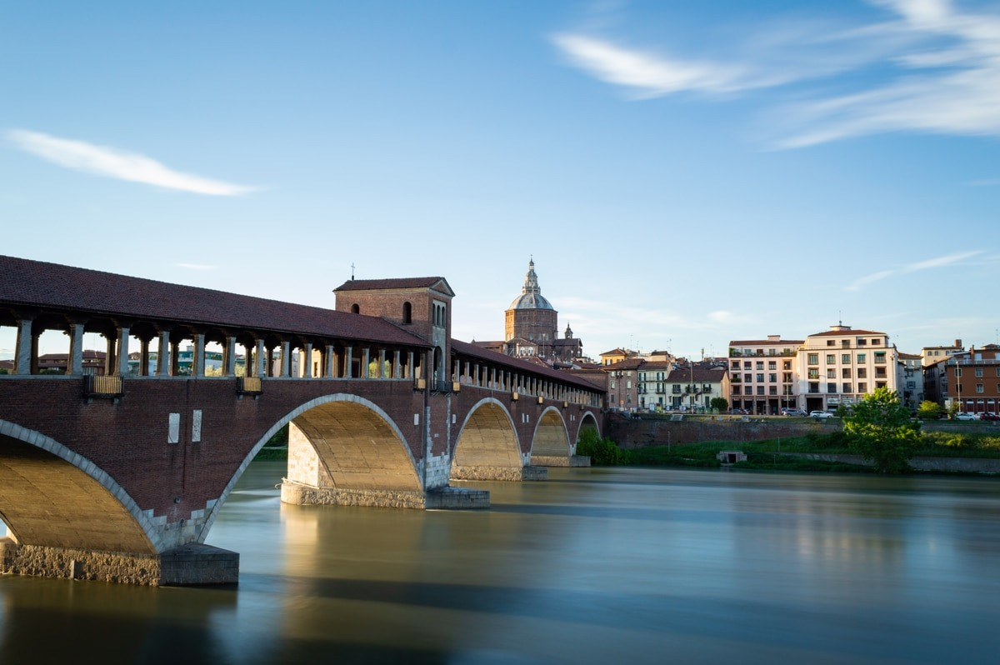

To verify if it is a relation between "nice" places and "deliciuos" places , we create a functions that calculate the distance between two couple of coordinate

In [22]:
def get_distance(lat1,lon1,lat2,lon2):
    R = 6373.0

    lat1 = radians(lat1)
    lon1 = radians(lon1)
    lat2 = radians(lat2)
    lon2 = radians(lon2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance

In [23]:
art_venues

,City,City Lat,City Lon,Venue Id,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City
519,Vidigulfo,45.292267,9.236651,4b058881f964a52067ca22e3,Cinema Eduardo,45.378111,9.211154,4bf58dd8d48988d17f941735,Movie Theater,9762
86,Vigevano,45.317094,8.858603,4bae6300f964a52091ab3be3,Teatro Moderno,45.314668,8.854951,4bf58dd8d48988d137941735,Theater,393
2,Pavia,45.186004,9.154637,4bb703501344b7134d4d9e04,Certosa di Pavia,45.256351,9.145799,4bf58dd8d48988d132941735,Church,7861
45,Vigevano,45.317094,8.858603,4bd4555db221c9b69952dbd0,Le Scuderie di Leonardo,45.317125,8.858682,4bf58dd8d48988d18f941735,Art Museum,7
329,Casorate Primo,45.312366,9.016846,4bdc596f2a3a0f47956bb2b6,Castello Visconteo,45.332075,9.099954,4deefb944765f83613cdba6e,Historic Site,6864
...,...,...,...,...,...,...,...,...,...,...
47,Vigevano,45.317094,8.858603,5c681302d48ec10039e81d80,Pinacoteca Civica,45.316351,8.856728,4bf58dd8d48988d18f941735,Art Museum,168
427,Belgioioso,45.158565,9.313756,5d4daf1dfc5ef000089e1cc8,Wonderland Pavia,45.191840,9.193007,4bf58dd8d48988d1e1931735,Arcade,10173
225,Gambolò,45.259030,8.859060,5d4e791dda59890008f8ec32,Museo Archeologico Della Lomellina,45.315716,8.856316,4bf58dd8d48988d190941735,History Museum,6313
515,Vidigulfo,45.292267,9.236651,5d8f7696a67bc000089949fd,Circo Millenium,45.275409,9.122584,52e81612bcbc57f1066b79e7,Circus,9129


Now foreach art place we calculate the distance from restaurant place

In [24]:
content = []
columns =['Art Id','Food Id','Distance']
for a_lat, a_lon, a_id in zip(art_venues['Venue Lat'],art_venues['Venue Lon'],art_venues['Venue Id']):
    for r_lat, r_lon, r_id in zip(food_venues['Venue Lat'],food_venues['Venue Lon'],food_venues['Venue Id']):
        row={}
        distance = get_distance(a_lat,a_lon,r_lat,r_lon)
        row['Art Id'] = a_id
        row['Food Id'] = r_id
        row['Distance'] = distance
        content.append(row)
art_food_distance = pd.DataFrame(content,columns=columns)
art_food_distance

,Art Id,Food Id,Distance
0,4b058881f964a52067ca22e3,4b72c39bf964a5207b872de3,21.907344
1,4b058881f964a52067ca22e3,4b77f71cf964a5205fb02ee3,27.180960
2,4b058881f964a52067ca22e3,4ba522abf964a52023e238e3,28.860231
3,4b058881f964a52067ca22e3,4ba66d6ef964a520645139e3,23.044999
4,4b058881f964a52067ca22e3,4ba769a1f964a520dd9139e3,22.155129
...,...,...,...
299035,607b1d7d6a99274b59af3aa5,60f31e27afec5f5d0891df4d,34.705220
299036,607b1d7d6a99274b59af3aa5,60f3628bae367562b8383af3,53.808985
299037,607b1d7d6a99274b59af3aa5,60f7dabca2148b05a76fe4aa,38.275776
299038,607b1d7d6a99274b59af3aa5,60f9b5ae1d6ca603564d1641,30.807308


Now we drop the record where distance is above 1 Km

In [25]:
art_food_distance = art_food_distance[art_food_distance['Distance']<=1]
art_food_distance

,Art Id,Food Id,Distance
133,4b058881f964a52067ca22e3,4d0925630ead8cfab8d4f376,0.781550
672,4b058881f964a52067ca22e3,5442ddf5498e9407253aafaa,0.556508
782,4b058881f964a52067ca22e3,5ab6382f86bc49601839b498,0.565753
842,4bae6300f964a52091ab3be3,4ba522abf964a52023e238e3,0.165128
856,4bae6300f964a52091ab3be3,4bd282a541b9ef3b3c5efee5,0.734428
...,...,...,...
297320,5d4e791dda59890008f8ec32,5cb07004d03360002c97a4eb,0.456907
297329,5d4e791dda59890008f8ec32,5da20ccf03db2f0007b3ef7c,0.211373
298015,5d8f7696a67bc000089949fd,5379d569498e84f67cb1c546,0.567051
298691,607b1d7d6a99274b59af3aa5,507f1bdfe4b0e40f4e277835,0.727903


Now Let's create a new column in food_venues if the restaurant is near to a art_place

In [26]:
food_venues['Near to Art'] = food_venues['Venue Id'].isin(art_food_distance['Food Id']).astype(int)

Let's also see if a restaurant is also near to a cities center (to this we only use the pure municipalities [ exclude no rank])


In [27]:
pure_muni = municipalities[municipalities['Rank'] != '---']
pure_muni

food_venues['Near to City center'] = ((food_venues['City'].isin(pure_muni['City'])) & (food_venues['Distance City'] <= 1000)).astype(int)
food_venues

,City,City Lat,City Lon,Venue Id,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City,Near to Art,Near to City center
6,Pavia,45.186004,9.154637,4b72c39bf964a5207b872de3,Il Portichetto,45.185260,9.154304,4bf58dd8d48988d16d941735,Café,86,1,1
458,Cassolnovo,45.365560,8.810088,4b77f71cf964a5205fb02ee3,Molino Santa Marta,45.425138,8.869623,4bf58dd8d48988d110941735,Italian Restaurant,8102,0,0
143,Mortara,45.247922,8.736385,4ba522abf964a52023e238e3,Ristorante Tre Re,45.315211,8.852986,4bf58dd8d48988d110941735,Italian Restaurant,11811,1,0
461,Cassolnovo,45.365560,8.810088,4ba66d6ef964a520645139e3,Gelato e caffe',45.394736,8.917107,4bf58dd8d48988d16d941735,Café,8975,1,0
45,Pavia,45.186004,9.154637,4ba769a1f964a520dd9139e3,Gelateria Da Cesare,45.182526,9.157592,4bf58dd8d48988d16d941735,Café,451,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
38,Pavia,45.186004,9.154637,60f31e27afec5f5d0891df4d,Pizzeria Molto Piu,45.186549,9.149685,4bf58dd8d48988d1ca941735,Pizza Place,393,1,1
195,Stradella,45.077356,9.295017,60f3628bae367562b8383af3,Agriturismo Bacchanalis,45.017273,9.408275,55a5a1ebe4b013909087cb7c,Agriturismo,11139,0,0
1089,Cassolnovo,45.365560,8.810088,60f7dabca2148b05a76fe4aa,Beer Park Croce Di Malto,45.430816,8.739527,4bf58dd8d48988d117941735,Beer Garden,9120,1,0
36,Pavia,45.186004,9.154637,60f9b5ae1d6ca603564d1641,Glozo,45.125427,9.119185,55a5a1ebe4b013909087cb8f,Sardinian Restaurant,7295,1,0


In [28]:
food_venues['Venue Category Name'].value_counts().to_frame()

,Venue Category Name
Bar,142
Italian Restaurant,91
Café,82
Pizza Place,74
Restaurant,57
...,...
Gay Bar,1
Eastern European Restaurant,1
Soccer Field,1
Falafel Restaurant,1


There's a lot of categories for the Restaurant and food store , let's try to semplify ( we export them in csv and look it better)

In [29]:
food_cat = food_venues['Venue Category Name'].value_counts().to_frame()
food_cat.to_csv("FoodCat.csv")

We manually grouped the Category so we can replace the column in the dataset

In [30]:
def map_rest_type(sc):
    if ("Bar" in sc
        or "Dive Bar" in sc 
        or "Karaoke Bar" in sc 
        or "Speakeasy" in sc 
        or "Cocktail Bar" in sc 
        or "Beach Bar" in sc 
        or "Rock Club" in sc
        or "Whisky Bar" in sc
        or "Hotel Bar" in sc
        or "Gay Bar" in sc
        or "Tennis Court" in sc
        or "Irish Pub" in sc
        or "Music Venue" in sc
        or "Soccer Field" in sc
        or "Sports Bar"in sc
        or "Lounge" in sc):
        return "Bar"
    elif ("Italian Restaurant" in sc
        or "Seafood Restaurant"in sc
        or "Mediterranean Restaurant" in sc
        or "Sicilian Restaurant" in sc
        or "Sardinian Restaurant"in sc):
        return "Italian"
    elif "Pizza Place" in sc:
        return "Pizza"
    elif ("Restaurant" in sc
        or "Diner" in sc
        or "Food" in sc
        or "Bistro" in sc):
        return "Restaurant"
    elif ("Cafè" in sc 
        or "Coffee Shop" in sc
        or "Pet Café" in sc
        or "Breakfast Spot" in sc
        or "Cafeteria" in sc):
        return "Cafè"
    elif ("Pub" in sc 
        or "Brewery" in sc 
        or "Gastropub" in sc 
        or "Beer Garden" in sc
        or "Beer Bar" in sc):
        return 'Pub'
    elif ("Ice Cream" in sc
        or "Gelato Shop" in sc):
        return "Ice Cream"
    elif "Bakery" in sc:
        return "Bakery"
    elif ("Steakhouse" in sc
        or "BBQ Joint" in sc
        or "German Restaurant" in sc):
        return "Steakhouse"
    elif ("Wine Bar" in sc 
        or "Winery" in sc
        or "Wine Shop"in sc):
        return "Wine Bar"
    elif ("Agriturismo" in sc 
        or "Trattoria/Osteria" in sc
        or "Theme Restaurant" in sc
        or "Piedmontese Restaurant" in sc
        or "Lombard Restaurant" in sc):
        return "Local"
    elif ("Food Court" in sc
        or "Burger Joint" in sc
        or "Fast Food Restaurant" in sc
        or "Sandwich Place" in sc
        or "Piadineria" in sc
        or "Snack Place" in sc
        or "Event Space" in sc
        or "Rest Area" in sc
        or "Food Truck"in sc):
        return "Fast Food"
    elif ("Chinese Restaurant" in sc
        or "Asian Restaurant" in sc):
        return "Chinese" 
    elif ("Dessert Shop" in sc
        or "Cupcake Shop" in sc
        or "Pastry Shop" in sc):
        return "Dessert Shop" 
    elif ("Japanese Restaurant" in sc
        or "Sushi Restaurant" in sc
        or "Poke Place" in sc
        or "Dumpling Restaurant"in sc):
        return "Japanese" 
    elif "Mexican Restaurant" in sc:
        return "Mexican" 
    elif ("Turkish Restaurant" in sc
        or "Middle Eastern Restaurant" in sc
        or "Falafel Restaurant" in sc
        or "Doner Restaurant" in sc):
        return "Turkish" 
    elif ("Deli / Bodega" in sc
        or "Indian Restaurant" in sc):
        return "Indian"
    else:
        return None

In [31]:
print(map_rest_type("Deli / Bodega"))

Indian


In [32]:
food_venues['Venue Category Name'] = food_venues['Venue Category Name'].apply(lambda x: map_rest_type(x))
food_venues

,City,City Lat,City Lon,Venue Id,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City,Near to Art,Near to City center
6,Pavia,45.186004,9.154637,4b72c39bf964a5207b872de3,Il Portichetto,45.185260,9.154304,4bf58dd8d48988d16d941735,None,86,1,1
458,Cassolnovo,45.365560,8.810088,4b77f71cf964a5205fb02ee3,Molino Santa Marta,45.425138,8.869623,4bf58dd8d48988d110941735,Italian,8102,0,0
143,Mortara,45.247922,8.736385,4ba522abf964a52023e238e3,Ristorante Tre Re,45.315211,8.852986,4bf58dd8d48988d110941735,Italian,11811,1,0
461,Cassolnovo,45.365560,8.810088,4ba66d6ef964a520645139e3,Gelato e caffe',45.394736,8.917107,4bf58dd8d48988d16d941735,None,8975,1,0
45,Pavia,45.186004,9.154637,4ba769a1f964a520dd9139e3,Gelateria Da Cesare,45.182526,9.157592,4bf58dd8d48988d16d941735,None,451,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
38,Pavia,45.186004,9.154637,60f31e27afec5f5d0891df4d,Pizzeria Molto Piu,45.186549,9.149685,4bf58dd8d48988d1ca941735,Pizza,393,1,1
195,Stradella,45.077356,9.295017,60f3628bae367562b8383af3,Agriturismo Bacchanalis,45.017273,9.408275,55a5a1ebe4b013909087cb7c,Local,11139,0,0
1089,Cassolnovo,45.365560,8.810088,60f7dabca2148b05a76fe4aa,Beer Park Croce Di Malto,45.430816,8.739527,4bf58dd8d48988d117941735,Pub,9120,1,0
36,Pavia,45.186004,9.154637,60f9b5ae1d6ca603564d1641,Glozo,45.125427,9.119185,55a5a1ebe4b013909087cb8f,Italian,7295,1,0


In [33]:
food_venues.dropna(axis= 0,inplace=True)

Now that we made a better categorization for the food places type let's create a new information for the dataset : Near Competitors Count.
To do this we use the distance function we used before 

In [34]:
content=[]
columns=['Venue Id','Near Competitors Count']
for f1lat,f1lon,f1id,f1cat in zip (food_venues['Venue Lat'],food_venues['Venue Lon'],food_venues['Venue Id'],food_venues['Venue Category Name']):
    c=0
    for f2lat,f2lon,f2id,f2cat in zip (food_venues['Venue Lat'],food_venues['Venue Lon'],food_venues['Venue Id'],food_venues['Venue Category Name']):
        row={}
        if (f1id != f2id and get_distance(f1lat,f1lon,f2lat,f2lon) <0.200 and f1cat == f2cat):
            c = c+1
    row['Venue Id'] = f1id
    row['Near Competitors Count'] = c
    content.append(row)
    
f_f_comp_count = pd.DataFrame(content,columns=columns)
f_f_comp_count
        

,Venue Id,Near Competitors Count
0,4b77f71cf964a5205fb02ee3,0
1,4ba522abf964a52023e238e3,1
2,4bb4817c0cbcef3b0404592a,0
3,4bb728b3941ad13a895420e3,0
4,4bb72cd0f562ef3bce143197,0
...,...,...
699,60f31e27afec5f5d0891df4d,0
700,60f3628bae367562b8383af3,0
701,60f7dabca2148b05a76fe4aa,0
702,60f9b5ae1d6ca603564d1641,0


In [35]:
food_venues = pd.merge(food_venues,f_f_comp_count, on ='Venue Id' )
food_venues

,City,City Lat,City Lon,Venue Id,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City,Near to Art,Near to City center,Near Competitors Count
0,Cassolnovo,45.365560,8.810088,4b77f71cf964a5205fb02ee3,Molino Santa Marta,45.425138,8.869623,4bf58dd8d48988d110941735,Italian,8102,0,0,0
1,Mortara,45.247922,8.736385,4ba522abf964a52023e238e3,Ristorante Tre Re,45.315211,8.852986,4bf58dd8d48988d110941735,Italian,11811,1,0,1
2,Casorate Primo,45.312366,9.016846,4bb4817c0cbcef3b0404592a,Hua Xin,45.423580,9.064049,4bf58dd8d48988d145941735,Restaurant,12918,1,0,0
3,Casorate Primo,45.312366,9.016846,4bb728b3941ad13a895420e3,Antica Trattoria Del Gallo,45.379898,9.024533,4bf58dd8d48988d110941735,Italian,7541,1,0,0
4,Varzi,44.823540,9.196904,4bb72cd0f562ef3bce143197,Bar Ginepro,44.868249,9.265002,4bf58dd8d48988d116941735,Bar,7325,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
699,Pavia,45.186004,9.154637,60f31e27afec5f5d0891df4d,Pizzeria Molto Piu,45.186549,9.149685,4bf58dd8d48988d1ca941735,Pizza,393,1,1,0
700,Stradella,45.077356,9.295017,60f3628bae367562b8383af3,Agriturismo Bacchanalis,45.017273,9.408275,55a5a1ebe4b013909087cb7c,Local,11139,0,0,0
701,Cassolnovo,45.365560,8.810088,60f7dabca2148b05a76fe4aa,Beer Park Croce Di Malto,45.430816,8.739527,4bf58dd8d48988d117941735,Pub,9120,1,0,0
702,Pavia,45.186004,9.154637,60f9b5ae1d6ca603564d1641,Glozo,45.125427,9.119185,55a5a1ebe4b013909087cb8f,Italian,7295,1,0,0


Now to complete our dataset we need to add last info : Number of likes venue retrive. 
Please Note : Forsquare is not so used in Italy so our analysis could influenced by this

In [36]:
def get_likes(ven_id):
    url = 'https://api.foursquare.com/v2/venues/{}/likes?&client_id={}&client_secret={}&v={}'.format(
    ven_id,
    CLIENT_ID,
    CLIENT_SECRET,
    VERSION)

    results = requests.get(url).json()["response"]['likes']
    return results['count']

print(get_likes('4b4f9418f964a520250c27e3'))

43


In [37]:
food_venues['Likes'] = food_venues['Venue Id'].apply(lambda x: get_likes(x))
food_venues

,City,City Lat,City Lon,Venue Id,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City,Near to Art,Near to City center,Near Competitors Count,Likes
0,Cassolnovo,45.365560,8.810088,4b77f71cf964a5205fb02ee3,Molino Santa Marta,45.425138,8.869623,4bf58dd8d48988d110941735,Italian,8102,0,0,0,16
1,Mortara,45.247922,8.736385,4ba522abf964a52023e238e3,Ristorante Tre Re,45.315211,8.852986,4bf58dd8d48988d110941735,Italian,11811,1,0,1,1
2,Casorate Primo,45.312366,9.016846,4bb4817c0cbcef3b0404592a,Hua Xin,45.423580,9.064049,4bf58dd8d48988d145941735,Restaurant,12918,1,0,0,11
3,Casorate Primo,45.312366,9.016846,4bb728b3941ad13a895420e3,Antica Trattoria Del Gallo,45.379898,9.024533,4bf58dd8d48988d110941735,Italian,7541,1,0,0,48
4,Varzi,44.823540,9.196904,4bb72cd0f562ef3bce143197,Bar Ginepro,44.868249,9.265002,4bf58dd8d48988d116941735,Bar,7325,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
699,Pavia,45.186004,9.154637,60f31e27afec5f5d0891df4d,Pizzeria Molto Piu,45.186549,9.149685,4bf58dd8d48988d1ca941735,Pizza,393,1,1,0,0
700,Stradella,45.077356,9.295017,60f3628bae367562b8383af3,Agriturismo Bacchanalis,45.017273,9.408275,55a5a1ebe4b013909087cb7c,Local,11139,0,0,0,0
701,Cassolnovo,45.365560,8.810088,60f7dabca2148b05a76fe4aa,Beer Park Croce Di Malto,45.430816,8.739527,4bf58dd8d48988d117941735,Pub,9120,1,0,0,0
702,Pavia,45.186004,9.154637,60f9b5ae1d6ca603564d1641,Glozo,45.125427,9.119185,55a5a1ebe4b013909087cb8f,Italian,7295,1,0,0,0


Let's add the City Area feature to the dataset 

In [38]:
food_venues = municipalities.join(food_venues.set_index('City'), on='City')
food_venues

,Rank,City,Population,Area,Density,Altitude,Latitude,Longitude,City Lat,City Lon,...,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City,Near to Art,Near to City center,Near Competitors Count,Likes
0,1st,Pavia,71.142,62.00,1147.5,77.0,45.186004,9.154637,45.186004,9.154637,...,Bar Sottovento,45.183503,9.155606,4bf58dd8d48988d11b941735,Pub,288,1,1,0,23
0,1st,Pavia,71.142,62.00,1147.5,77.0,45.186004,9.154637,45.186004,9.154637,...,Asahi,45.181884,9.160868,4bf58dd8d48988d111941735,Restaurant,670,1,1,0,20
0,1st,Pavia,71.142,62.00,1147.5,77.0,45.186004,9.154637,45.186004,9.154637,...,Caffe Dell'Abate,45.204119,9.149158,4bf58dd8d48988d1cc941735,Steakhouse,2061,1,0,0,43
0,1st,Pavia,71.142,62.00,1147.5,77.0,45.186004,9.154637,45.186004,9.154637,...,Il Broletto,45.185278,9.154318,4bf58dd8d48988d11b941735,Pub,84,1,1,2,22
0,1st,Pavia,71.142,62.00,1147.5,77.0,45.186004,9.154637,45.186004,9.154637,...,Schnauzer pub,45.186502,9.153900,4bf58dd8d48988d11b941735,Pub,80,1,1,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14,---,Varzi,3.383,57.61,59.0,426.0,44.823540,9.196904,44.823540,9.196904,...,Romana Cafè Cucina e Pizza,44.821970,9.199700,4bf58dd8d48988d1ca941735,Pizza,281,1,0,0,0
14,---,Varzi,3.383,57.61,59.0,426.0,44.823540,9.196904,44.823540,9.196904,...,Hosteria del Castello,44.868580,9.265966,4bf58dd8d48988d1ca941735,Pizza,7406,1,0,0,0
14,---,Varzi,3.383,57.61,59.0,426.0,44.823540,9.196904,44.823540,9.196904,...,le cicale di buscone,44.821968,9.199581,4bf58dd8d48988d110941735,Italian,274,1,0,0,1
14,---,Varzi,3.383,57.61,59.0,426.0,44.823540,9.196904,44.823540,9.196904,...,Il Barino,44.869302,9.261747,4bf58dd8d48988d116941735,Bar,7220,1,0,0,0


Ok now we have a dataset full of information, let's clean it.

Let's drop ids and useless columns

In [39]:
food_venues.drop(columns=['Rank', 'Venue Id', 'Venue CategoryId','Latitude','Longitude'],inplace=True)
food_venues

,City,Population,Area,Density,Altitude,City Lat,City Lon,Venue Name,Venue Lat,Venue Lon,Venue Category Name,Distance City,Near to Art,Near to City center,Near Competitors Count,Likes
0,Pavia,71.142,62.00,1147.5,77.0,45.186004,9.154637,Bar Sottovento,45.183503,9.155606,Pub,288,1,1,0,23
0,Pavia,71.142,62.00,1147.5,77.0,45.186004,9.154637,Asahi,45.181884,9.160868,Restaurant,670,1,1,0,20
0,Pavia,71.142,62.00,1147.5,77.0,45.186004,9.154637,Caffe Dell'Abate,45.204119,9.149158,Steakhouse,2061,1,0,0,43
0,Pavia,71.142,62.00,1147.5,77.0,45.186004,9.154637,Il Broletto,45.185278,9.154318,Pub,84,1,1,2,22
0,Pavia,71.142,62.00,1147.5,77.0,45.186004,9.154637,Schnauzer pub,45.186502,9.153900,Pub,80,1,1,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14,Varzi,3.383,57.61,59.0,426.0,44.823540,9.196904,Romana Cafè Cucina e Pizza,44.821970,9.199700,Pizza,281,1,0,0,0
14,Varzi,3.383,57.61,59.0,426.0,44.823540,9.196904,Hosteria del Castello,44.868580,9.265966,Pizza,7406,1,0,0,0
14,Varzi,3.383,57.61,59.0,426.0,44.823540,9.196904,le cicale di buscone,44.821968,9.199581,Italian,274,1,0,0,1
14,Varzi,3.383,57.61,59.0,426.0,44.823540,9.196904,Il Barino,44.869302,9.261747,Bar,7220,1,0,0,0


Now we rename some columns

In [40]:
food_venues.columns = ['RefCity','RefCityPopulation','RefCityArea','RefCityDensity','RefCityAltitude','RefCityLat','RefCityLon','Name','Lat','Lon','Category','DistanceRefCityCenter','ArtNear','CityCenterNear','NearCompetitors','Likes']

Let's do some normalization to the data :
- Altitude and Distance City are mesured in m instead of Km as Area and Density

In [41]:
food_venues['RefCityAltitude'] = food_venues['RefCityAltitude']/1000

In [42]:
food_venues['DistanceRefCityCenter'] = food_venues['DistanceRefCityCenter']/1000

In [43]:
food_venues

,RefCity,RefCityPopulation,RefCityArea,RefCityDensity,RefCityAltitude,RefCityLat,RefCityLon,Name,Lat,Lon,Category,DistanceRefCityCenter,ArtNear,CityCenterNear,NearCompetitors,Likes
0,Pavia,71.142,62.00,1147.5,0.077,45.186004,9.154637,Bar Sottovento,45.183503,9.155606,Pub,0.288,1,1,0,23
0,Pavia,71.142,62.00,1147.5,0.077,45.186004,9.154637,Asahi,45.181884,9.160868,Restaurant,0.670,1,1,0,20
0,Pavia,71.142,62.00,1147.5,0.077,45.186004,9.154637,Caffe Dell'Abate,45.204119,9.149158,Steakhouse,2.061,1,0,0,43
0,Pavia,71.142,62.00,1147.5,0.077,45.186004,9.154637,Il Broletto,45.185278,9.154318,Pub,0.084,1,1,2,22
0,Pavia,71.142,62.00,1147.5,0.077,45.186004,9.154637,Schnauzer pub,45.186502,9.153900,Pub,0.080,1,1,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14,Varzi,3.383,57.61,59.0,0.426,44.823540,9.196904,Romana Cafè Cucina e Pizza,44.821970,9.199700,Pizza,0.281,1,0,0,0
14,Varzi,3.383,57.61,59.0,0.426,44.823540,9.196904,Hosteria del Castello,44.868580,9.265966,Pizza,7.406,1,0,0,0
14,Varzi,3.383,57.61,59.0,0.426,44.823540,9.196904,le cicale di buscone,44.821968,9.199581,Italian,0.274,1,0,0,1
14,Varzi,3.383,57.61,59.0,0.426,44.823540,9.196904,Il Barino,44.869302,9.261747,Bar,7.220,1,0,0,0


In [44]:
food_venues.to_csv('def_food_venues.csv')

Ok now that we prepare the data let's explore them !

## 3. EDA

### Numeric Features

#### 1. Relation Distance - Likes

Text(0.5, 1.0, 'Distance from Reference city - Number of like')

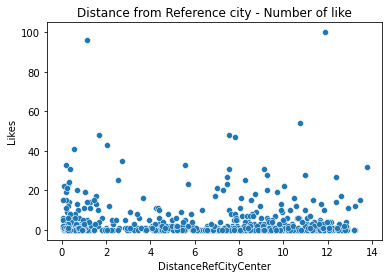

In [45]:
sns.scatterplot(x='DistanceRefCityCenter',y='Likes',data=food_venues)
plt.title('Distance from Reference city - Number of like')

#### 2. Relation Population - Likes

Text(0.5, 1.0, 'Population of Reference city - Number of like')

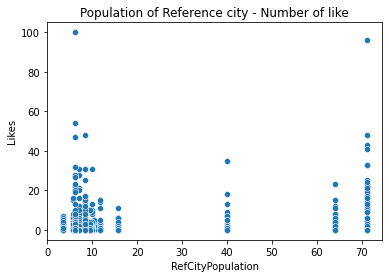

In [46]:
sns.scatterplot(x='RefCityPopulation',y='Likes',data=food_venues)
plt.title('Population of Reference city - Number of like')

#### 3. Relation Area - Likes

Text(0.5, 1.0, 'Area of Reference city - Number of like')

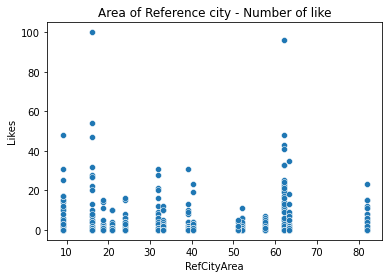

In [47]:
sns.scatterplot(x='RefCityArea',y='Likes',data=food_venues)
plt.title('Area of Reference city - Number of like')

#### 4. Relation Density - Likes

Text(0.5, 1.0, 'Density of Reference city - Number of like')

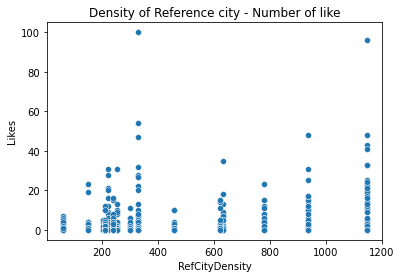

In [48]:
sns.scatterplot(x='RefCityDensity',y='Likes',data=food_venues)
plt.title('Density of Reference city - Number of like')

#### 5. Relation Altitude - Likes

Text(0.5, 1.0, 'Altitude of Reference city - Number of like')

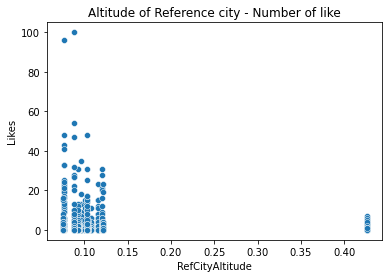

In [49]:
sns.scatterplot(x='RefCityAltitude',y='Likes',data=food_venues)
plt.title('Altitude of Reference city - Number of like')

#### Notes:
- It doesn't exist a direct relation between distance from the city center and number of likes
- RefCityPopulation could be a cat variable
- It doesn't exist a particolar correlation between Area/Density and numenr of likes
- We can discard Altitude because mostly of the likes cover only low altitudes

In [50]:
def categorize_pop(pop):
    if pop <= 20:
        return '<= 20'
    if pop > 20 and pop < 60:
        return '> 20 / < 60'
    else :
        return '>= 60'


In [51]:
food_venues['RefCityPopulation'] = food_venues['RefCityPopulation'].apply(lambda x: categorize_pop(x))
food_venues

,RefCity,RefCityPopulation,RefCityArea,RefCityDensity,RefCityAltitude,RefCityLat,RefCityLon,Name,Lat,Lon,Category,DistanceRefCityCenter,ArtNear,CityCenterNear,NearCompetitors,Likes
0,Pavia,>= 60,62.00,1147.5,0.077,45.186004,9.154637,Bar Sottovento,45.183503,9.155606,Pub,0.288,1,1,0,23
0,Pavia,>= 60,62.00,1147.5,0.077,45.186004,9.154637,Asahi,45.181884,9.160868,Restaurant,0.670,1,1,0,20
0,Pavia,>= 60,62.00,1147.5,0.077,45.186004,9.154637,Caffe Dell'Abate,45.204119,9.149158,Steakhouse,2.061,1,0,0,43
0,Pavia,>= 60,62.00,1147.5,0.077,45.186004,9.154637,Il Broletto,45.185278,9.154318,Pub,0.084,1,1,2,22
0,Pavia,>= 60,62.00,1147.5,0.077,45.186004,9.154637,Schnauzer pub,45.186502,9.153900,Pub,0.080,1,1,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14,Varzi,<= 20,57.61,59.0,0.426,44.823540,9.196904,Romana Cafè Cucina e Pizza,44.821970,9.199700,Pizza,0.281,1,0,0,0
14,Varzi,<= 20,57.61,59.0,0.426,44.823540,9.196904,Hosteria del Castello,44.868580,9.265966,Pizza,7.406,1,0,0,0
14,Varzi,<= 20,57.61,59.0,0.426,44.823540,9.196904,le cicale di buscone,44.821968,9.199581,Italian,0.274,1,0,0,1
14,Varzi,<= 20,57.61,59.0,0.426,44.823540,9.196904,Il Barino,44.869302,9.261747,Bar,7.220,1,0,0,0


#### Correlation of numeric feature

In [52]:
corr = food_venues[['RefCityArea','RefCityDensity','RefCityAltitude','DistanceRefCityCenter','NearCompetitors','Likes']].corr()
corr

,RefCityArea,RefCityDensity,RefCityAltitude,DistanceRefCityCenter,NearCompetitors,Likes
RefCityArea,1.000000,0.240668,0.253640,-0.362659,0.147432,-0.008889
RefCityDensity,0.240668,1.000000,-0.396168,-0.381432,0.139458,0.211406
RefCityAltitude,0.253640,-0.396168,1.000000,0.038880,-0.086246,-0.097627
DistanceRefCityCenter,-0.362659,-0.381432,0.038880,1.000000,-0.217370,-0.041253
NearCompetitors,0.147432,0.139458,-0.086246,-0.217370,1.000000,-0.029047
Likes,-0.008889,0.211406,-0.097627,-0.041253,-0.029047,1.000000


#### Note: 
- Nothing seems realy correlated 

### Cat Features

#### 1. Category - Likes

<function matplotlib.pyplot.show(close=None, block=None)>

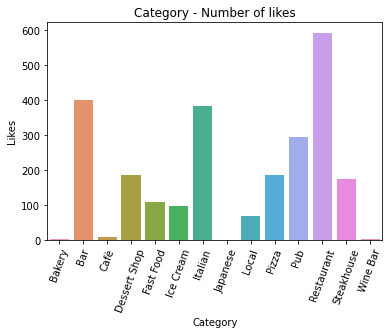

In [53]:
cat_likes = food_venues.groupby('Category').sum()['Likes'].to_frame()
cat_likes.reset_index(inplace=True)
cat_likes.columns=['Category','Likes']
sns.barplot(x='Category',y='Likes',data=cat_likes)
plt.xticks(rotation=70)
plt.title('Category - Number of likes')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

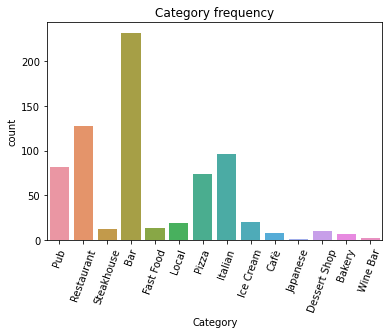

In [54]:
sns.countplot(x='Category',data=food_venues)
plt.xticks(rotation=70)
plt.title('Category frequency')
plt.show

#### 2. Cities - Likes

<function matplotlib.pyplot.show(close=None, block=None)>

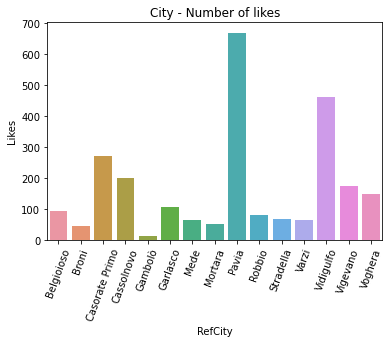

In [55]:
city_likes = food_venues.groupby('RefCity').sum()['Likes'].to_frame()
city_likes.reset_index(inplace=True)
city_likes.columns=['RefCity','Likes']
sns.barplot(x='RefCity',y='Likes',data=city_likes)
plt.xticks(rotation=70)
plt.title('City - Number of likes')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

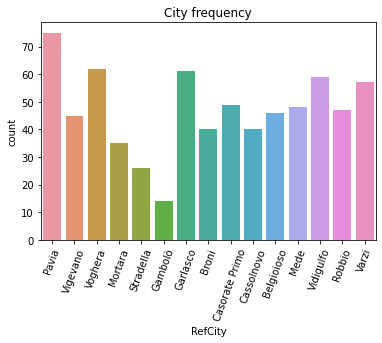

In [56]:
sns.countplot(x='RefCity',data=food_venues)
plt.xticks(rotation=70)
plt.title('City frequency')
plt.show

#### 3. Near to Art - Likes 

<function matplotlib.pyplot.show(close=None, block=None)>

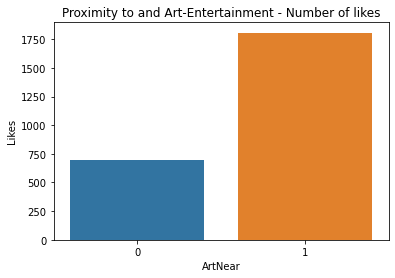

In [57]:
art_likes = food_venues.groupby('ArtNear').sum()['Likes'].to_frame()
art_likes.reset_index(inplace=True)
art_likes.columns=['ArtNear','Likes']
sns.barplot(x='ArtNear',y='Likes',data=art_likes)
plt.title('Proximity to and Art-Entertainment - Number of likes' )
plt.show

#### 4. Near to city center - Likes

<function matplotlib.pyplot.show(close=None, block=None)>

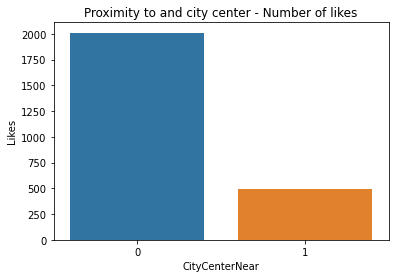

In [58]:
cc_likes = food_venues.groupby('CityCenterNear').sum()['Likes'].to_frame()
cc_likes.reset_index(inplace=True)
cc_likes.columns=['CityCenterNear','Likes']
sns.barplot(x='CityCenterNear',y='Likes',data=cc_likes)
plt.title('Proximity to and city center - Number of likes' )
plt.show

#### Note:
- Categories that received more Likes are : Italian, Restaurant and Bar but (except for Bar) their are not the more frequency in dataset
- Major numer of like compare in the capital city Pavia and in the zone near Milan (Casorate Primo , Vidigulfo)
- Venues that are near a Art venue receive more like 
- Venues that are not near to the city center receive more like

## 3. Methodology & 4. Results

Now , based on what is our objective and on what we discovered with EDA, we wanna find area where we can put a specific type of restaurant.
We discovered the restaurant with more like are near to an art venue (under a km) and far from the city center (more then a km)

So now we use the art_venue dataframe to identify the candidate zone 

In [59]:
candidate_place = art_venues[art_venues['Distance City'] > 1000]
candidate_place.drop(['Venue Id','Venue CategoryId'], axis=1)

candidate_place

,City,City Lat,City Lon,Venue Id,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City
519,Vidigulfo,45.292267,9.236651,4b058881f964a52067ca22e3,Cinema Eduardo,45.378111,9.211154,4bf58dd8d48988d17f941735,Movie Theater,9762
2,Pavia,45.186004,9.154637,4bb703501344b7134d4d9e04,Certosa di Pavia,45.256351,9.145799,4bf58dd8d48988d132941735,Church,7861
329,Casorate Primo,45.312366,9.016846,4bdc596f2a3a0f47956bb2b6,Castello Visconteo,45.332075,9.099954,4deefb944765f83613cdba6e,Historic Site,6864
293,Broni,45.062162,9.261191,4bdd4d78f219c9b6235b1210,Motodromo Castelleto Di Branduzzo,45.070077,9.104150,4bf58dd8d48988d1f4931735,Racetrack,12378
31,Pavia,45.186004,9.154637,4c0b9c087e3fc928f47ef582,Gain studios,45.181837,9.179760,4bf58dd8d48988d1e5931735,Music Venue,2025
...,...,...,...,...,...,...,...,...,...,...
8,Pavia,45.186004,9.154637,5c3b7a4167af3a002dbef8f2,Lnp Serie B,45.200165,9.175199,4bf58dd8d48988d18b941735,Basketball Stadium,2255
427,Belgioioso,45.158565,9.313756,5d4daf1dfc5ef000089e1cc8,Wonderland Pavia,45.191840,9.193007,4bf58dd8d48988d1e1931735,Arcade,10173
225,Gambolò,45.259030,8.859060,5d4e791dda59890008f8ec32,Museo Archeologico Della Lomellina,45.315716,8.856316,4bf58dd8d48988d190941735,History Museum,6313
515,Vidigulfo,45.292267,9.236651,5d8f7696a67bc000089949fd,Circo Millenium,45.275409,9.122584,52e81612bcbc57f1066b79e7,Circus,9129


Now we suppose our restaurateaur is interested to open a Pizza restaurant (not the most frequency category but not also the least) in the Voghera Zone. We'll search for every of it's candidate place the ones that haven't a near Pizza restaurant

In [60]:
pizza = food_venues[food_venues['Category'] =='Pizza']
candidate_place = candidate_place[candidate_place['City'] == 'Voghera']
dist_to_res =[]
for c_x , c_y in zip(candidate_place['Venue Lat'], candidate_place['Venue Lon']):
    min_d = 10000
    for f_x, f_y in zip (pizza['Lat'],pizza['Lon']):
        d = get_distance(c_x,c_y,f_x,f_y)
        if d < min_d:
            min_d = d
    dist_to_res.append(min_d)

candidate_place['Distance to Rest'] = dist_to_res
candidate_place

<ipython-input-60-2b2754d547ea>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  candidate_place['Distance to Rest'] = dist_to_res


,City,City Lat,City Lon,Venue Id,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City,Distance to Rest
97,Voghera,44.99284,9.008593,4c530feeeac576b0c30537f4,Cowboys' Guest Ranch,44.968740,9.014768,4bf58dd8d48988d1e9931735,Rock Club,2726,2.681187
107,Voghera,44.99284,9.008593,4c8915357223b1f7a2e230a8,Palestra L. Da Vinci,44.981004,9.024688,4bf58dd8d48988d1f1931735,General Entertainment,1828,2.010112
131,Voghera,44.99284,9.008593,4c99038ed799a1cdbc41b752,Centro Sportivo,45.012897,9.128170,4bf58dd8d48988d184941735,Stadium,9673,4.640828
104,Voghera,44.99284,9.008593,4c9cfea17d69b71365f024c2,The Space Cinema,44.999908,9.070706,4bf58dd8d48988d180941735,Multiplex,4952,0.135148
120,Voghera,44.99284,9.008593,4d4037a789616dcb753402b5,Aquaviva,44.984717,8.994328,4bf58dd8d48988d193941735,Water Park,1441,1.080180
134,Voghera,44.99284,9.008593,4d8f4cc7d4ec8cfa47df8789,Stadio Comunale,45.010908,9.130190,4bf58dd8d48988d188941735,Soccer Stadium,9780,4.727148
115,Voghera,44.99284,9.008593,4dfe0fcb45ddebdfeaafdf31,Piscina di Casteggio,45.012882,9.128183,4bf58dd8d48988d193941735,Water Park,9673,4.641270
132,Voghera,44.99284,9.008593,4e10425fe4cdef074b68eb74,Rocca Di Montalfeo,44.906137,9.039812,4bf58dd8d48988d1f1931735,General Entertainment,9960,4.995966
116,Voghera,44.99284,9.008593,4e1ed5e3cc3f012b9756e046,Newcastle cabaret,44.980748,8.880842,4bf58dd8d48988d18e941735,Comedy Club,10147,4.650342
118,Voghera,44.99284,9.008593,4e3edf6ab0fb875af8754acb,Castellar Guidobono,44.905510,8.948619,4bf58dd8d48988d1e5931735,Music Venue,10808,3.406317


In [61]:
print('Avg distance from Pizza rest', candidate_place['Distance to Rest'].mean())

Avg distance from Pizza rest 3.5193679106143207


In [62]:
candidate_place = candidate_place[candidate_place['Distance to Rest'] > candidate_place['Distance to Rest'].mean()]
candidate_place

,City,City Lat,City Lon,Venue Id,Venue Name,Venue Lat,Venue Lon,Venue CategoryId,Venue Category Name,Distance City,Distance to Rest
131,Voghera,44.99284,9.008593,4c99038ed799a1cdbc41b752,Centro Sportivo,45.012897,9.128170,4bf58dd8d48988d184941735,Stadium,9673,4.640828
134,Voghera,44.99284,9.008593,4d8f4cc7d4ec8cfa47df8789,Stadio Comunale,45.010908,9.130190,4bf58dd8d48988d188941735,Soccer Stadium,9780,4.727148
115,Voghera,44.99284,9.008593,4dfe0fcb45ddebdfeaafdf31,Piscina di Casteggio,45.012882,9.128183,4bf58dd8d48988d193941735,Water Park,9673,4.641270
132,Voghera,44.99284,9.008593,4e10425fe4cdef074b68eb74,Rocca Di Montalfeo,44.906137,9.039812,4bf58dd8d48988d1f1931735,General Entertainment,9960,4.995966
116,Voghera,44.99284,9.008593,4e1ed5e3cc3f012b9756e046,Newcastle cabaret,44.980748,8.880842,4bf58dd8d48988d18e941735,Comedy Club,10147,4.650342
129,Voghera,44.99284,9.008593,4e87826cb63437a4b893ea22,Las Vegas,44.916317,9.027906,4bf58dd8d48988d17c941735,Casino,8653,4.856121
127,Voghera,44.99284,9.008593,4ead200082315d0ca577e5ef,Parco Avventura Salice,44.915977,9.027732,4bf58dd8d48988d1e7941735,Playground,8688,4.820360
123,Voghera,44.99284,9.008593,50d3371fe4b0d14de7ba8eb1,Biblioteca Civica P. A. Soldini,44.980658,8.880670,4bf58dd8d48988d1f1931735,General Entertainment,10162,4.667216
125,Voghera,44.99284,9.008593,51928a9f498edf76554c8147,Palazzo Centurione,44.981426,8.878037,4deefb944765f83613cdba6e,Historic Site,10357,4.781627
133,Voghera,44.99284,9.008593,51c60e3a498efee48d50b855,La Capitania,44.916644,8.886082,4bf58dd8d48988d1f4931735,Racetrack,12848,8.309714


Let's plot the art and enterteinment place where we could place our restaurant near

In [63]:
from folium import plugins
from folium.plugins import HeatMap

city_coord = [municipalities[municipalities['City'] =='Voghera']['Latitude'],municipalities[municipalities['City'] =='Voghera']['Longitude']]
map_p = folium.Map(location=city_coord, zoom_start=10.5)
plotting_point(map_p,candidate_place['Venue Lat'],candidate_place['Venue Lon'],candidate_place['Venue Name'],'yellow',2.6)
map_p

#### 1. K-Means
Now we apply a cluster algorithm to identify 3 area where place our restaurant


In [64]:
from sklearn.cluster import KMeans

number_of_cluster = 3

good = candidate_place[['Venue Lat','Venue Lon']].values

kmeans = KMeans(n_clusters= number_of_cluster,random_state=0).fit(good)

centers = kmeans.cluster_centers_

restaurant_latlons=pizza[['Lat','Lon']]

centers

array([[44.91218279,  9.0322911 ],
       [44.96486914,  8.88140797],
       [45.02729585,  9.09473364]])

In [65]:
map_p = folium.Map(location=city_coord, zoom_start=10.5)
folium.TileLayer('Stamen Terrain').add_to(map_p)
HeatMap(restaurant_latlons).add_to(map_p)
for lat,lon in centers:
    folium.Circle([lat, lon], radius=1000, color='green', fill=True, fill_opacity=0.25).add_to(map_p) 
for lat, lon,name in zip(candidate_place['Venue Lat'],candidate_place['Venue Lon'],candidate_place['Venue Name']):
    folium.CircleMarker([lat, lon], radius=2, color='yellow', fill=True, fill_color='blue', fill_opacity=1, popup=name).add_to(map_p)
map_p

The algorithmidentify 3 location and with the help of a Heatmap that show the density of other Pizza Restaurant show us that seem work good :
- The most appetitable zone is south of Voghera near Rivanazzano where we have 5 actractions and no Pizza
- The second is in Casteggio with 2 actractions 
- And the last is collocate between Cervesina  and Castelnuovo where we have no Pizza Restaurant

Now lets prepare a series of function to run the algorithm on every type of restaurant or zone

In [66]:
def create_candidate_dataset(cat, city):
    df = art_venues[art_venues['Distance City'] > 1000]
    df.drop(['Venue Id','Venue CategoryId'], axis=1)
    
    food = food_venues[food_venues['Category'] ==cat]
    if city is not None and len(city) >0:## city is not specified i take all location
        df = df[df['City'] == city]
    else:
        df=df
    dist =[]
    for c_x , c_y in zip(df['Venue Lat'], df['Venue Lon']):
        min_d = 10000
        for f_x, f_y in zip (food['Lat'],food['Lon']):
            d = get_distance(c_x,c_y,f_x,f_y)
            if d < min_d:
                min_d = d
        dist.append(min_d)

    df['Distance to Rest'] = dist
    df = df[df['Distance to Rest'] > df['Distance to Rest'].mean()]
    return df



In [67]:
def get_location(df):
    from sklearn.cluster import KMeans
    candidates_count = df['Venue Id'].count()
    number_of_cluster = round(candidates_count/3)

    good = df[['Venue Lat','Venue Lon']].values

    kmeans = KMeans(n_clusters= number_of_cluster,random_state=0).fit(good)

    centers = kmeans.cluster_centers_
    return centers

In [68]:
def plot_result(restaurant_latlons,df,centers,zoom_lev,area_center):
    map_p = folium.Map(location=area_center, zoom_start=zoom_lev)
    folium.TileLayer('Stamen Toner').add_to(map_p)
    HeatMap(restaurant_latlons).add_to(map_p)
    for lat,lon in centers:
        folium.Circle([lat, lon], radius=1000, color='green', fill=True, fill_opacity=0.25).add_to(map_p) 
    for lat, lon,name in zip(df['Venue Lat'],df['Venue Lon'],df['Venue Name']):
        folium.CircleMarker([lat, lon], radius=2, color='yellow', fill=True, fill_color='blue', fill_opacity=1, popup=name).add_to(map_p)
    return map_p

Let's plot the candidate place for Local restaurant accross all the area

In [69]:
category ='Local'
food_cat_places = food_venues[food_venues['Category'] ==category]
food_cat_coord= food_cat_places[['Lat','Lon']]

loc_1 = create_candidate_dataset(category,'')
locs = get_location(loc_1)

area_center=[latitude_c,longitude_c]
zoom=8.5
def_map = plot_result(food_cat_coord,loc_1,locs,zoom,area_center)
def_map

<ipython-input-66-48ff116d25bd>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Distance to Rest'] = dist


From this plotting we realize:
- the algorithm suggest us to open a local (restaurant that produce tipical food of the area) restaurant in the zone of North Pavia or near Milan
- because major of tipical product are produce in Oltrepo', Varzi zone and Lomellina (Mortara, Vigevano) --> this coincedes with the reality and with a personal opinion : there are few place where we can eat tipical food in the cities area

In [70]:
category ='Fast Food'
food_cat_places = food_venues[food_venues['Category'] ==category]
food_cat_coord= food_cat_places[['Lat','Lon']]

ff_1 = create_candidate_dataset(category,'')
locs = get_location(ff_1)

area_center=[latitude_c,longitude_c]
zoom=8.5
def_map = plot_result(food_cat_coord,ff_1,locs,zoom,area_center)
def_map

<ipython-input-66-48ff116d25bd>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Distance to Rest'] = dist


Contrary if we wanna open a Fast Food algorithm suggest us to open it far for the principal routes that link agricole area to the city.
A nice strategic point could the one near Motta visconti and Bereguardo that is on the route for Milan but at least far from the other Fast food place

In [71]:
category ='Italian'
food_cat_places = food_venues[food_venues['Category'] ==category]
food_cat_coord= food_cat_places[['Lat','Lon']]

it_1 = create_candidate_dataset(category,'')
locs = get_location(it_1)

area_center=[latitude_c,longitude_c]
zoom=8.5
def_map = plot_result(food_cat_coord,it_1,locs,zoom,area_center)
def_map

<ipython-input-66-48ff116d25bd>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Distance to Rest'] = dist


As we see the Italian category cover all the region the algorithm suggest Lomellina Zone as a good place to open a classic mediterranean restaurant

#### 2. DBSCAN

Let's now try to use a dbscan algorithm on the different 3 cases : Local-FastFood-Italian

In [79]:
import sklearn.utils
sklearn.utils.check_random_state(1000)

loc_2 = create_candidate_dataset('Local','')


def dbs_cluster(df):
    from sklearn.cluster import DBSCAN
    good = df[['Venue Lat','Venue Lon']].values
    db = DBSCAN(eps = 0.1,min_samples= 3).fit(good)
    core_samples_mask = np.zeros_like(db.labels_,dtype=bool)
    core_samples_mask[db.core_sample_indices_]=True
    labels = db.labels_
    df['Clus_Db'] = labels
    clusterNum = len(set(labels)) 
    return clusterNum,labels

<ipython-input-66-48ff116d25bd>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Distance to Rest'] = dist


In [80]:
clusterNum,labels = dbs_cluster(loc_2)

In [83]:
def plot_dbs_clust(clusterNum,category,zoom_lev,candidates,labels):
    import matplotlib.cm as cm
    import matplotlib.colors as colors
    x = np.arange(clusterNum)
    ys = [i + x + (i*x)**2 for i in range(clusterNum)]
    colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
    rainbow = [colors.rgb2hex(i) for i in colors_array]

    food_cat_places = food_venues[food_venues['Category'] ==category]
    food_cat_coord= food_cat_places[['Lat','Lon']]

    map_p = folium.Map(location=area_center, zoom_start=zoom_lev)
    folium.TileLayer('Stamen Toner').add_to(map_p)
    HeatMap(food_cat_coord).add_to(map_p)
    for clust_number in set(labels):
        clust_set = candidates[candidates.Clus_Db == clust_number]                    
        if clust_number != -1:
            cenx=np.mean(clust_set['Venue Lat']) 
            ceny=np.mean(clust_set['Venue Lon'])
            folium.CircleMarker([cenx, ceny], radius=5, color=rainbow[clust_number], fill=True, fill_opacity=0.25).add_to(map_p) 
            for lat, lon,name in zip(clust_set['Venue Lat'],clust_set['Venue Lon'],clust_set['Venue Name']):
                folium.CircleMarker([lat, lon], radius=2, color=rainbow[clust_number], fill=True, fill_color='blue', fill_opacity=1, popup=name).add_to(map_p)
    return map_p


In [84]:
map_p = plot_dbs_clust(clusterNum,'Local',8.5,loc_2,labels)
map_p

In [85]:
category='Fast Food'
ff_2 = create_candidate_dataset(category,'')
clusterNum, labels= dbs_cluster(ff_2)
map_p = plot_dbs_clust(clusterNum,category,8.5,ff_2,labels)
map_p

<ipython-input-66-48ff116d25bd>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Distance to Rest'] = dist


In [86]:
category='Italian'
it_2 = create_candidate_dataset(category,'')
clusterNum,labels= dbs_cluster(it_2)
map_p = plot_dbs_clust(clusterNum,category,8.5,it_2,labels)
map_p

<ipython-input-66-48ff116d25bd>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Distance to Rest'] = dist


## 5. Discussion

To summarize to find the bast place for open a restaurant in Pavia province, we need to identify the type of restaurant we wanna take. One it is taken we need to use the results of a K-means and DBSCAN algoritms that work on the proximity to Art-Entertainment point and Cities Center.
The first one help us to find some specific point near the principal activities, the second help us to identify the macro-zone where (for exemple) we can launch a restaurant chain  or a advertising campaign. The last one seems to doesn’t work very well if the region is full of restaurant of the specific type.



## 6. Conclusion

To improve the results we can better divide the category of Art-Entertainment to retrive information like:
- If a particular type of entertainment influence the number of like of a specific type of cuisine 
- Or if the number of likes of an entertainment category influence the number of like of specific type of cuisine